# A Simple DTW (Dynamic Time Warping) Application Example
## Synchronizing studio vs. live versions of the Introduction of: 
## Iron Maiden - Fear of the Dark
### Renato Profeta - PhD Candidate - [TU Ilmenau](https://www.tu-ilmenau.de/en/applied-media-systems-group/)

*The excerpts of songs used in this jupyter notebook are for educational purposes only. 
This jupyter notebook is based on [musicinformationretrieval.com](https://musicinformationretrieval.com/index.html) and on librosa documentation [Music Synchronization with Dynamic Time Warping](https://librosa.github.io/librosa_gallery/auto_examples/plot_music_sync.html).

## Short Intuition about DTW
The main idea behind dynamic time warping is to find an alignment between two time-dependet sequences, "warping" the sequences in a nonlinear way, trying to match each other. 
In general terms, the DTW technique try to compensate differences in tempo finding a nonlinear alignement between the elements of two series.
For more information on NMF, check out section 3.2 of [Fundamentals of Music Processing book](https://www.audiolabs-erlangen.de/fau/professor/mueller/bookFMP), by Meinard Müller.

Let's start by importing the Python Packages we're going to use.

In [1]:
# Import Python Modules
from __future__ import print_function
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import IPython.display as ipd
import seaborn
import scipy, scipy.spatial
import librosa
import librosa.display

#Other Configurations
%matplotlib notebook
# If you run into trouble with iopub_data_rate try startung the jupyter notebook using jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000

Let's now import the studio and live  versions of the introduction of Iron Maiden's Fear of the Dark, and play it back.

In [2]:
# Import Audio File to be Analised - Studio Version
# Iron Maiden - Fear of the Dark (studio)
filename = 'Iron Maiden - Fear Of The Dark Intro (studio).wav'
x1, fs1 = librosa.load(filename)
ipd.Audio(x1, rate=fs1)

In [3]:
# Import Audio File to be Analised - Studio Version
# Iron Maiden - Fear of the Dark (Live)
filename = 'Iron Maiden - Fear Of The Dark Intro (live).wav'
x2, fs2 = librosa.load(filename)
ipd.Audio(x2, rate=fs2)

Now, we can plot the waveforms of the two different versions and try to find some useful information in the time domain.

<IPython.core.display.Javascript object>


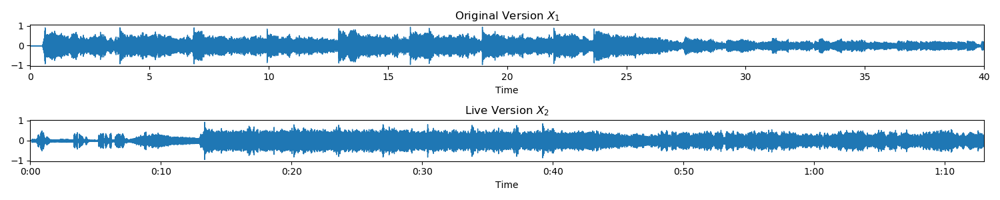

In [4]:
#Plot Original Version
plt.figure(figsize=(15, 3))
plt.subplot(211)
librosa.display.waveplot(x1, sr=fs1)
plt.title('Original Version $X_1$')
plt.tight_layout()
plt.subplot(212)
# Plot Live Version
librosa.display.waveplot(x2, sr=fs2)
plt.title('Live Version $X_2$')
plt.tight_layout()

It's possible to hear and see that the guitars on the live version start after a short speech introduction by Sir Bruce Dickinson. The studio version tempo seems to be a bit faster than the live one.

Let's now compute the chroma representation of the audio files and used as feature representations to perform some nonlinear alignment using de DTW technique.

In [5]:
# Chroma Features
hop_length = 256
C1_cens = librosa.feature.chroma_cens(x1, sr=fs1, hop_length=hop_length)
C2_cens = librosa.feature.chroma_cens(x2, sr=fs2, hop_length=hop_length)

<IPython.core.display.Javascript object>


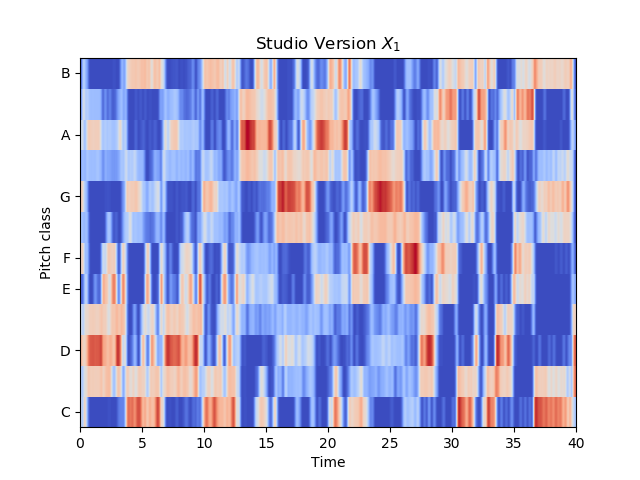

<IPython.core.display.Javascript object>


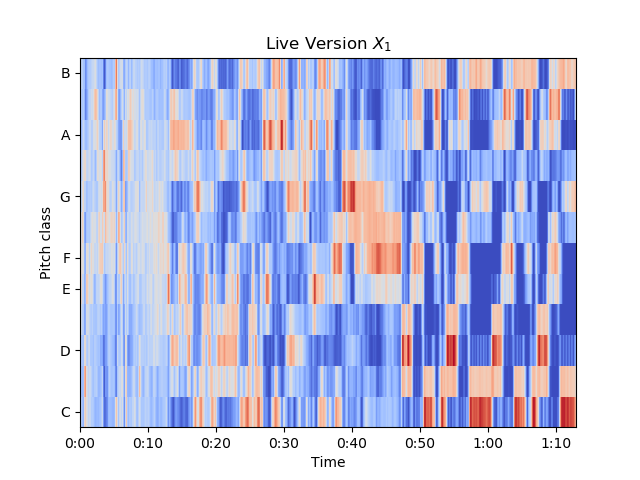

In [6]:
plt.figure()
plt.title('Studio Version $X_1$');
librosa.display.specshow(C1_cens, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm');
plt.figure()
plt.title('Live Version $X_1$');
librosa.display.specshow(C2_cens, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm');

At this point we can define some functions to compute the Dynamic Time Warping. The following functions are taken from [www.musicinformationretrieval.com/dtw_example](https://musicinformationretrieval.com/dtw_example.html).

In [7]:
# Time Warping
def dtw_table(x, y, distance=None):
    if distance is None:
        distance = scipy.spatial.distance.euclidean
    nx = len(x)
    ny = len(y)
    table = np.zeros((nx+1, ny+1))
    
    # Compute left column separately, i.e. j=0.
    table[1:, 0] = np.inf
        
    # Compute top row separately, i.e. i=0.
    table[0, 1:] = np.inf
        
    # Fill in the rest.
    for i in range(1, nx+1):
        for j in range(1, ny+1):
            d = distance(x[i-1], y[j-1])
            table[i, j] = d + min(table[i-1, j], table[i, j-1], table[i-1, j-1])
    return table

def dtw(x, y, table):
    i = len(x)
    j = len(y)
    path = [(i, j)]
    while i > 0 or j > 0:
        minval = np.inf
        if table[i-1][j-1] < minval:
            minval = table[i-1, j-1]
            step = (i-1, j-1)
        if table[i-1, j] < minval:
            minval = table[i-1, j]
            step = (i-1, j)
        if table[i][j-1] < minval:
            minval = table[i, j-1]
            step = (i, j-1)
        path.insert(0, step)
        i, j = step
    return np.array(path)


Let's calculate a local distance measure to compare the two different features and plot the warping path.

In [8]:
D = dtw_table(C1_cens.T, C2_cens.T, distance=scipy.spatial.distance.cityblock)
path = dtw(C1_cens.T, C2_cens.T, D)

<IPython.core.display.Javascript object>


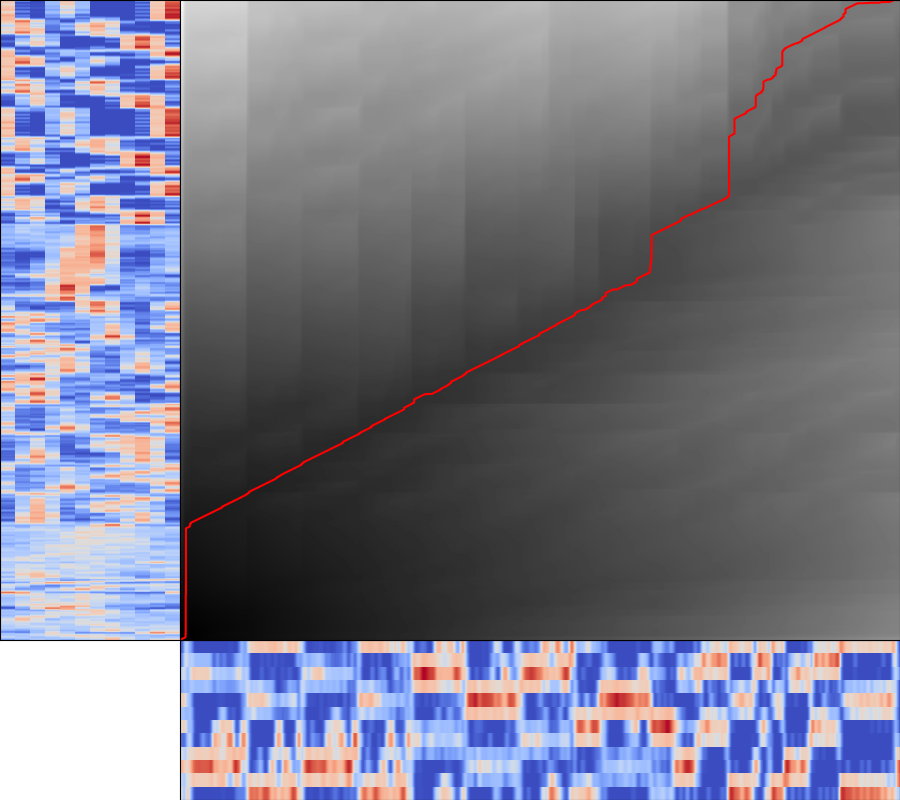

In [9]:
plt.figure(figsize=(9, 8))

# Bottom right plot.
ax1 = plt.axes([0.2, 0, 0.8, 0.20])
ax1.set_xlabel('Studio Version')
ax1.imshow(C1_cens, origin='lower', aspect='auto', cmap='coolwarm')
ax1.set_xticks([])
ax1.set_yticks([])

# Top left plot.
ax2 = plt.axes([0, 0.2, 0.20, 0.8])
ax2.imshow(C2_cens.T[:,::-1], origin='lower', aspect='auto', cmap='coolwarm')
ax2.set_ylabel('Live Version')
ax2.set_xticks([])
ax2.set_yticks([])

# Top right plot.
ax3 = plt.axes([0.2, 0.2, 0.8, 0.8])
ax3.imshow(D.T, aspect='auto', origin='lower', interpolation='nearest', cmap='gray')
ax3.set_xticks([])
ax3.set_yticks([])

# Path.
ax3.plot(path[:,0], path[:,1], 'r')

Let's now try to plot some synchronized markers on both versions and see if we could find some alignment between the studio and live versions of the song.

<IPython.core.display.Javascript object>


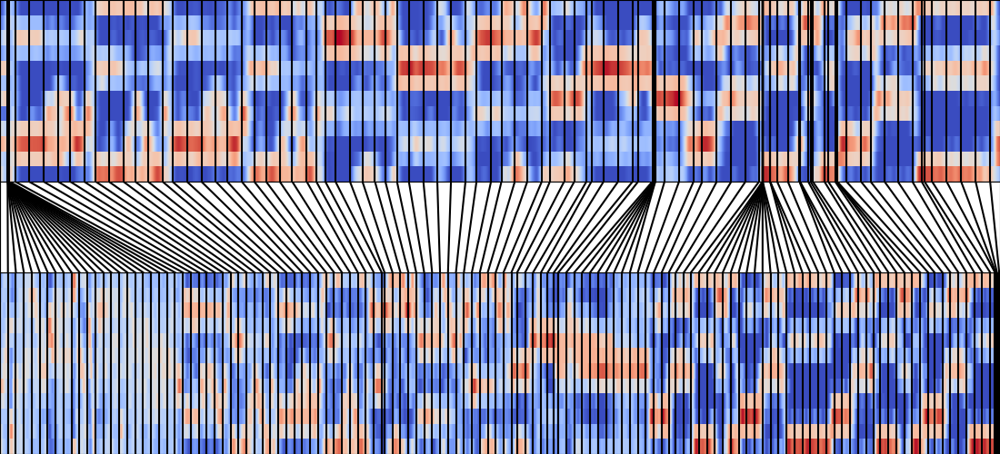

[]

In [10]:
plt.figure(figsize=(11, 5))

# Top plot.
ax1 = plt.axes([0, 0.60, 1, 0.40])
ax1.imshow(C1_cens, origin='lower', aspect='auto', cmap='coolwarm')
ax1.set_ylabel('Signal 1')
ax1.set_xticks([])
ax1.set_yticks([])
#ax1.set_ylim(20)
ax1.set_xlim(0, C1_cens.shape[1])

# Bottom plot.
ax2 = plt.axes([0, 0, 1, 0.40])
ax2.imshow(C2_cens,origin='lower', aspect='auto', cmap='coolwarm')
ax2.set_ylabel('Signal 2')
ax2.set_xticks([])
ax2.set_yticks([])
#ax2.set_ylim(20)
ax2.set_xlim(0, C2_cens.shape[1])

# Middle plot.
line_color = 'k'
step = 50
n1 = float(C1_cens.shape[1])
n2 = float(C2_cens.shape[1])
ax3 = plt.axes([0, 0.40, 1, 0.20])
for t in path[::step]:
    ax3.plot((t[0]/n1, t[1]/n2), (1, -1), color=line_color)
    ax3.set_xlim(0, 1)
    ax3.set_ylim(-1, 1)

# Path markers on top and bottom plot.
y1_min, y1_max = ax1.get_ylim()
y2_min, y2_max = ax2.get_ylim()
ax1.vlines([t[0] for t in path[::step]], y1_min, y1_max, color=line_color)
ax2.vlines([t[1] for t in path[::step]], y2_min, y2_max, color=line_color)
ax3.set_xticks([])
ax3.set_yticks([])

We can also use librosa DTW built-in function. [librosa example DTW](https://librosa.github.io/librosa_gallery/auto_examples/plot_music_sync.html)

<IPython.core.display.Javascript object>


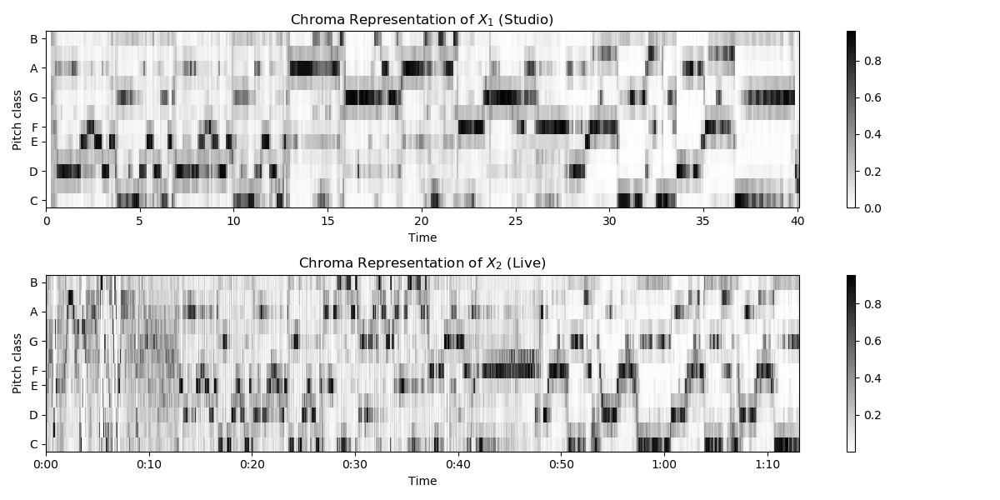

In [11]:
# Chroma features
n_fft = 4410
hop_size = 2205

x_1_chroma = librosa.feature.chroma_stft(y=x1, sr=fs1, tuning=0, norm=2,
                                         hop_length=hop_size, n_fft=n_fft)
x_2_chroma = librosa.feature.chroma_stft(y=x2, sr=fs2, tuning=0, norm=2,
                                         hop_length=hop_size, n_fft=n_fft)

plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.title('Chroma Representation of $X_1$ (Studio) ')
librosa.display.specshow(x_1_chroma, x_axis='time',
                         y_axis='chroma', cmap='gray_r', hop_length=hop_size)
plt.colorbar()
plt.subplot(2, 1, 2)
plt.title('Chroma Representation of $X_2$ (Live)')
librosa.display.specshow(x_2_chroma, x_axis='time',
                         y_axis='chroma', cmap='gray_r', hop_length=hop_size)
plt.colorbar()
plt.tight_layout()

<IPython.core.display.Javascript object>


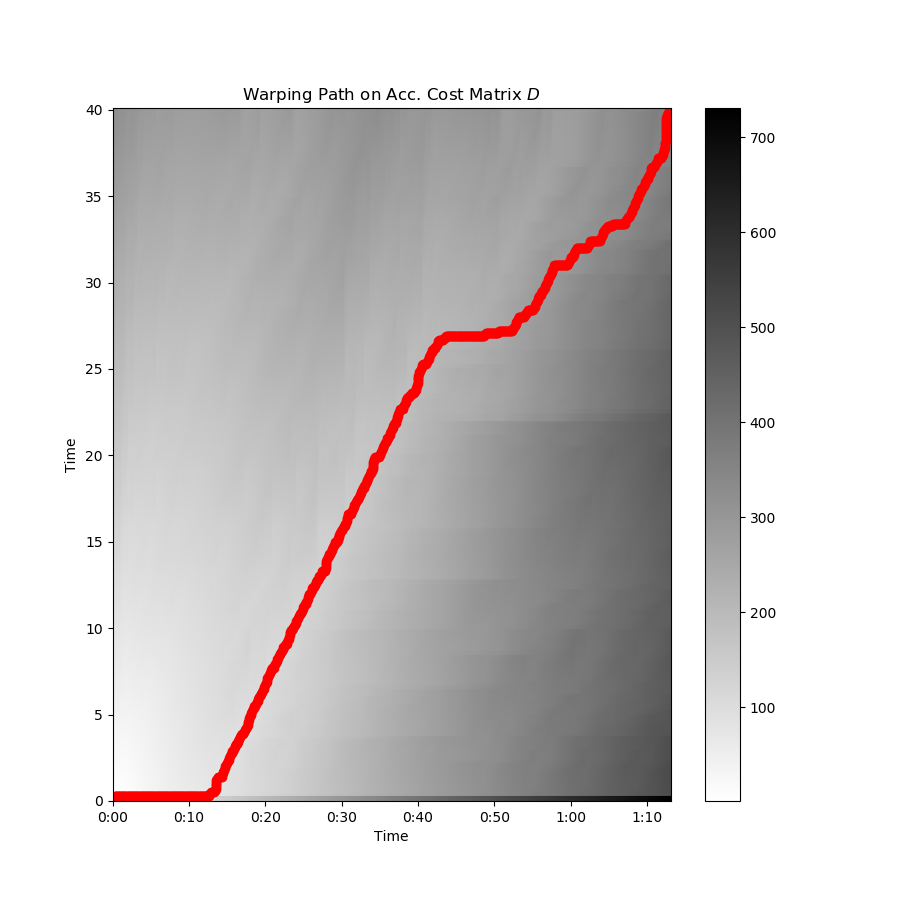

In [12]:
# Aligning Chroma Sequences
D, wp = librosa.core.dtw(X=x_1_chroma, Y=x_2_chroma, metric='euclidean')
wp_s = np.asarray(wp) * hop_size / fs1
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(111)
librosa.display.specshow(D, x_axis='time', y_axis='time',
                         cmap='gray_r', hop_length=hop_size)
imax = ax.imshow(D, cmap=plt.get_cmap('gray_r'),
                 origin='lower', interpolation='nearest', aspect='auto')
ax.plot(wp_s[:, 1], wp_s[:, 0], marker='o', color='r')
plt.title('Warping Path on Acc. Cost Matrix $D$')
plt.colorbar();

We can visualize how both waveforms are aligned in the time domain.

<IPython.core.display.Javascript object>


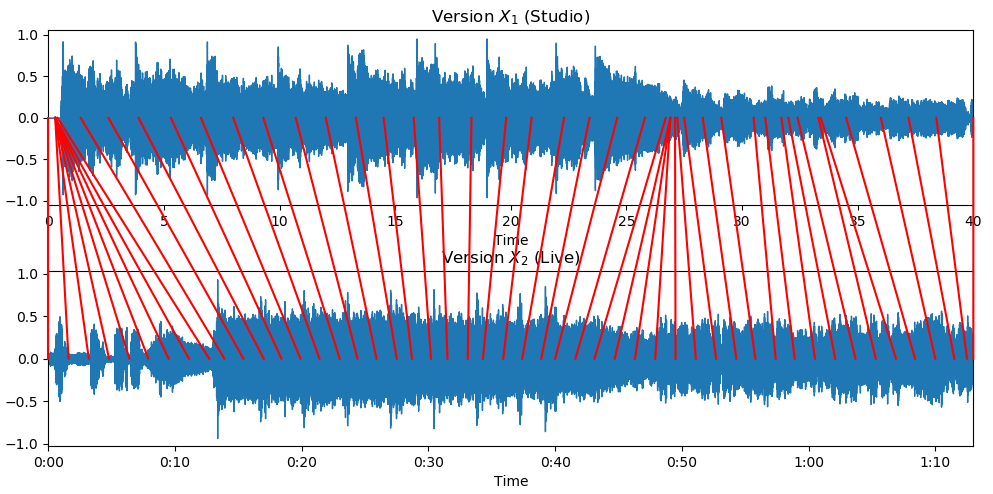

In [13]:
fig = plt.figure(figsize=(12, 6))

# Plot x_1
plt.subplot(2, 1, 1)
librosa.display.waveplot(x1, sr=fs1)
plt.title('Version $X_1$ (Studio)')
ax1 = plt.gca()

# Plot x_2
plt.subplot(2, 1, 2)
librosa.display.waveplot(x2, sr=fs2)
plt.title('Version $X_2$ (Live)')
ax2 = plt.gca()

plt.tight_layout()

trans_figure = fig.transFigure.inverted()
lines = []
arrows = 50
points_idx = np.int16(np.round(np.linspace(0, wp.shape[0] - 1, arrows)))

# for tp1, tp2 in zip((wp[points_idx, 0]) * hop_size, (wp[points_idx, 1]) * hop_size):
for tp1, tp2 in wp[points_idx] * hop_size / fs1:
    # get position on axis for a given index-pair
    coord1 = trans_figure.transform(ax1.transData.transform([tp1, 0]))
    coord2 = trans_figure.transform(ax2.transData.transform([tp2, 0]))

    # draw a line
    line = matplotlib.lines.Line2D((coord1[0], coord2[0]),
                                   (coord1[1], coord2[1]),
                                   transform=fig.transFigure,
                                   color='r')
    lines.append(line)

fig.lines = lines
plt.tight_layout()

From looking at the waveforms and the synchronization lines we can observe that the guitars start at the red line 6 (at around 13 seconds of the Live version, bottom plot). So if we want to play both files at the same point where the guitars start we need to start playing from the corresponding indexesof each version.
We can use the path index path computed earlier to play both versions at the correspondent desired times.

In [14]:
#Let's use the synchronization red lines to help us 
#print(np.flipud(wp[points_idx])*hop_size)
sample_location=np.flipud(wp[points_idx])*hop_size
ipd.display(ipd.Audio(x1[sample_location[8][0]:], rate=fs1))
ipd.display(ipd.Audio(x2[sample_location[8][1]:], rate=fs2))

We can also see and hear that at around 27 seconds of the studio version it's the end of the first guitar riff, it comes a small pause and then it starts another riff with clean guitars. This is around the red synchronization line 31. Our DTW technique tells us that 27s of the studio version is equivalent to 45 seconds in the live version.
We can hear both versions at the equivalent time.

In [15]:
# Find the time of synchronization line 31
print(sample_location[31]/fs1)
ipd.display(ipd.Audio(x1[sample_location[31][0]:], rate=fs1))
ipd.display(ipd.Audio(x2[sample_location[31][1]:], rate=fs2))

[ 26.9  46.3]


## Small Conclusion
We saw that we can use the DTW technique to align feature representations of different versions of the same song and bring them into temporal correspondence. For a deeper look into how this technique works, take a look at Section 3.2 of [Fundamentals of Music Processing book](https://www.audiolabs-erlangen.de/fau/professor/mueller/bookFMP), by Meinard Müller.